In [31]:
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import sklearn
import os
import shutil
import cv2
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.metrics import confusion_matrix, classification_report

In [32]:
#Importing all the necessary libraries for image processing
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Dropout, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.callbacks import EarlyStopping, Callback , ModelCheckpoint
from tensorflow.keras.metrics import Accuracy,binary_crossentropy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [33]:
os.getcwd()

'c:\\Users\\Shaikh\\Desktop\\jupyter'

In [34]:
#Loading the text file
fold_df = pd.read_csv("C:/Users/Shaikh/Desktop/jupyter/Folds.csv")

In [35]:
#Defining the paths
img_path = "../BreaKHis_v1/"
classes = ["benign","malign"]

In [36]:
#Renaming the column filename to path
fold_df = fold_df.rename(columns = {"filename":"path"})
#Printing the head of the file
fold_df.head(3)

,fold,mag,grp,path
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...


In [37]:
#One example path is printed
fold_df['path'][1]

'BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-002.png'

In [38]:
#Extracting the filename and label from the path column
fold_df['filename'] = fold_df['path'].apply(lambda x:x.split("/")[-1])
fold_df["label"] = fold_df['path'].apply(lambda x: x.split("/")[3])

In [39]:
fold_df.head(3)

,fold,mag,grp,path,filename,label
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-001.png,benign
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-002.png,benign
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-003.png,benign


In [40]:
#Creating new directory
os.makedirs("Sagar")

FileExistsError: [WinError 183] Cannot create a file when that file already exists: 'Sagar'

In [48]:

# Moving all the images to one folder
for p in fold_df['path']:
    # full source path
    src = os.path.join("C:/Users/Shaikh/Desktop/jupyter/BreakHis_v1", p)

    # destination folder
    dest_folder = "C:/Users/Shaikh/Desktop/jupyter/Sagar"
    os.makedirs(dest_folder, exist_ok=True)  # make sure destination folder exists

    # Now we split the path
    parts = p.split("/")   # split using '/' because p uses Linux-style slashes

    # Get class name and file name
    class_name = parts[3]  # 'benign' is at index 3
    file_name = parts[-1]  # last part is filename

    # final destination path
    dest = os.path.join(dest_folder, f"{class_name}_{file_name}")

    # copy the file
    shutil.copyfile(src, dest)


In [49]:
#Checking the len
len(os.listdir("C:/Users/Shaikh/Desktop/jupyter/Sagar"))

7909

In [50]:
#Creating a new data frame with labels and file names stored in single folder
fold_df['file_loc'] = fold_df['label'] + "_" + fold_df['filename']
#Encoding the class to integer
fold_df['class'] = fold_df['label'].apply(lambda x: 0 if x =='benign' else 1)

In [51]:
#Printing the head to display the changed made
fold_df.head(3)

,fold,mag,grp,path,filename,label,file_loc,class
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-001.png,benign,benign_SOB_B_A-14-22549AB-100-001.png,0
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-002.png,benign,benign_SOB_B_A-14-22549AB-100-002.png,0
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-003.png,benign,benign_SOB_B_A-14-22549AB-100-003.png,0


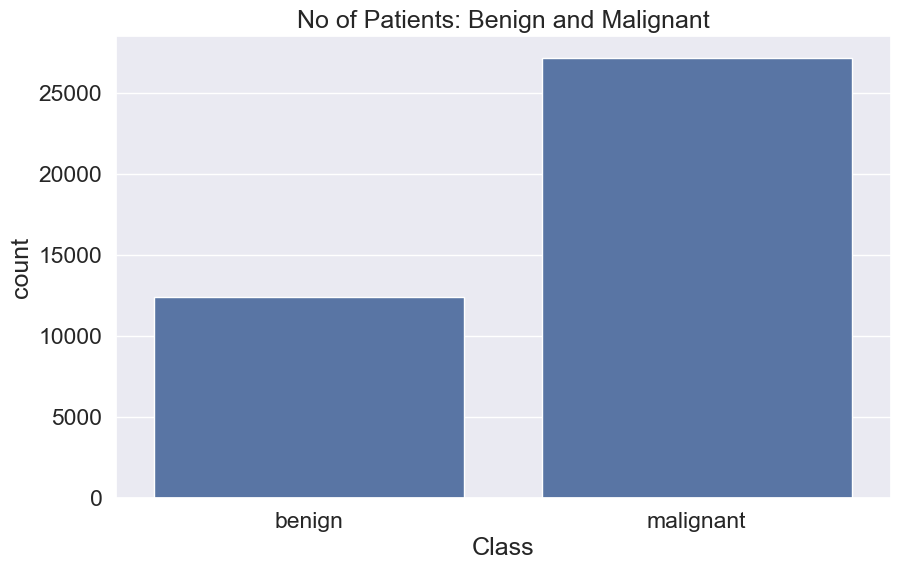

In [53]:

# Let's explore the dataset
plt.figure(figsize=(10,6))
sns.set(font_scale=1.5)
sns.set_style("darkgrid")
sns.countplot(x=fold_df['label'])  # <<< pass as x=

plt.xlabel("Class")
plt.title("No of Patients: Benign and Malignant")
plt.show()


In [54]:
#Filtering the data frame to benign and malignant for visualization
benign_df = fold_df[fold_df['label'] == 'benign']
malignant_df = fold_df[fold_df['label'] == 'malignant']

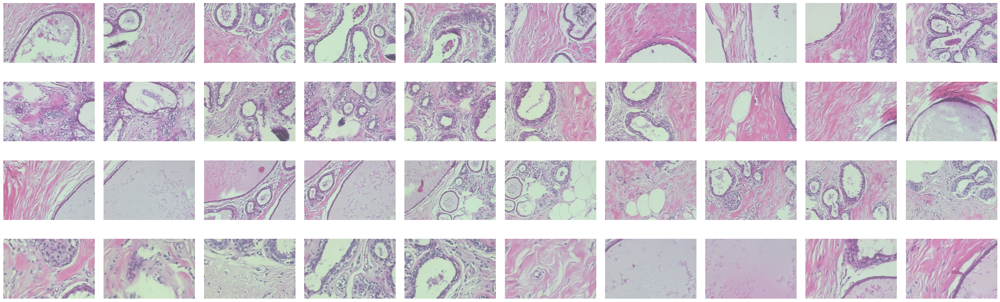

In [56]:


plt.figure(figsize=(30,10))

for i in range(40):
    plt.subplot(4,10,i+1)
    
    # Correct path joining
    img_path = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar", benign_df['file_loc'][i])
    
    img = cv2.imread(img_path, 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # convert BGR to RGB for correct colors
    
    plt.imshow(img)
    plt.axis('off')  # hide axis for better visualization

plt.tight_layout()
plt.show()


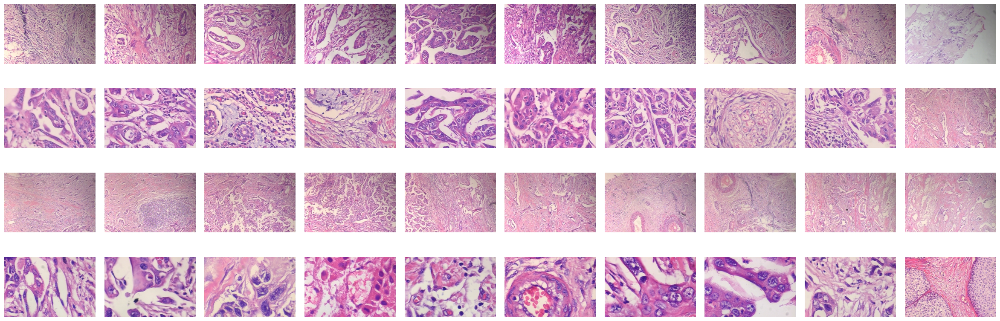

In [65]:

plt.figure(figsize=(30,10))

for i in range(40):
    plt.subplot(4,10,i+1)
    
    img_path = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar", malignant_df['file_loc'].iloc[i])
    
    img = cv2.imread(img_path, 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    
    plt.imshow(img)
    plt.axis('off')  # Hide the axes to remove extra spacing

# Remove extra space between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.12)

plt.show()


In [66]:
#Creating a new data frame with the file loc as its index, label and class of the patients as its columns.
df = pd.DataFrame(os.listdir("C:/Users/Shaikh/Desktop/jupyter/Sagar"))
df = df.rename(columns = {0:'file_loc'})
df['label'] = df['file_loc'].apply(lambda x:x.split("_")[0])
df['class'] = df['label'].apply(lambda x: 0 if x =='benign' else 1)
df.set_index("file_loc",inplace=True)

In [67]:
#Performing the splitting
data_train_and_val, data_test = train_test_split(df, test_size = 0.1, random_state = 47)
#Traing and val
data_train, data_val = train_test_split(data_train_and_val, test_size = 0.1, random_state = 47)

In [68]:
print("Training size :", data_train.shape)
print("Validation size :", data_val.shape)
print("Testing size :", data_test.shape)

Training size : (6406, 2)
Validation size : (712, 2)
Testing size : (791, 2)


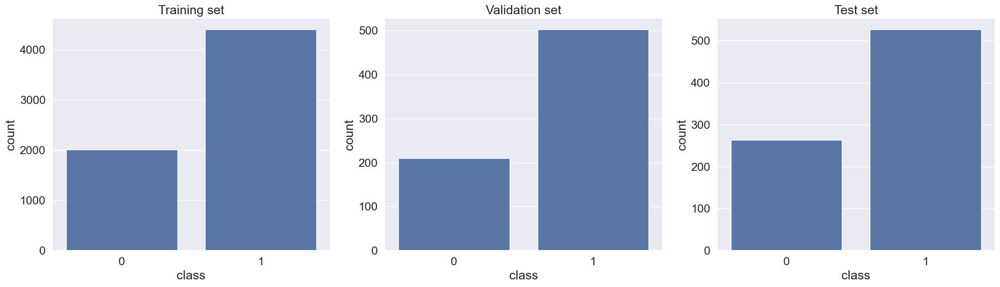

In [70]:


# Set the style
sns.set_style("darkgrid")

# Create the figure with a specific size
plt.figure(figsize=(20,6))

# Subplot for Training set
plt.subplot(1, 3, 1)
sns.countplot(data=data_train, x='class')  # Ensure 'class' column is correctly referenced
plt.title("Training set")

# Subplot for Validation set
plt.subplot(1, 3, 2)
sns.countplot(data=data_val, x='class')
plt.title("Validation set")

# Subplot for Test set
plt.subplot(1, 3, 3)
sns.countplot(data=data_test, x='class')
plt.title("Test set")

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()


In [71]:
#Separating the benign and malignant patients from train data
train_has_cancer = data_train[data_train['class'] == 1]
train_has_no_cancer = data_train[data_train['class'] == 0]

In [74]:
train_has_cancer.shape

(4400, 2)

In [73]:
train_has_no_cancer.shape

(2006, 2)

In [75]:
#Upsampling the minority class by the size of majority class with replacement
train_has_no_cancer_upsample = resample(train_has_no_cancer, n_samples = len(train_has_cancer), 
                                     random_state = 47, replace = True)

In [76]:
#Concatenating the upsampled minority class and the majority class
data_train = pd.concat([train_has_cancer,train_has_no_cancer_upsample])

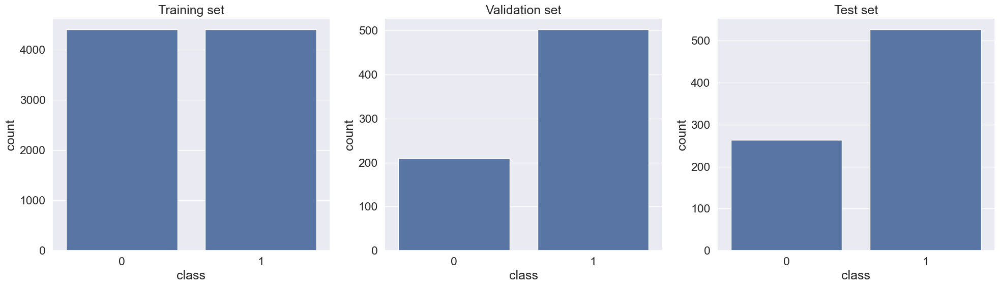

In [77]:

# Set the style
sns.set_style("darkgrid")

# Create the figure with a specific size
plt.figure(figsize=(20, 6))

# Subplot for Training set
plt.subplot(1, 3, 1)
sns.countplot(x=data_train['class'])  # Explicitly passing x='class'
plt.title("Training set")

# Subplot for Validation set
plt.subplot(1, 3, 2)
sns.countplot(x=data_val['class'])  # Explicitly passing x='class'
plt.title("Validation set")

# Subplot for Test set
plt.subplot(1, 3, 3)
sns.countplot(x=data_test['class'])  # Explicitly passing x='class'
plt.title("Test set")

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()


In [81]:
#Creating the directories to store images
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_train")
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_test")
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_validation")
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_train/benign")
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_train/malignant")
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_validation/benign")
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_validation/malignant")
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_test/benign")
os.makedirs("C:/Users/Shaikh/Desktop/jupyter/Sagar_test/malignant")

In [85]:
#Training data
i = 1
for img in data_train.index:
    if img!=".DS_Store":
        target = df.loc[img,'class']
        if target == 1:
            label = 'malignant'
        else:          
            label = 'benign'      
        src = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar",img)
        dest = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar_train",label, "image" + str(i)+".png")
        img1 = np.array(cv2.imread(src))
        cv2.imwrite(dest,img1)
        i = i+1

In [86]:
#Validation data
for img in data_val.index:
    target = data_val.loc[img,'class']
    if target == 1:
        label = 'malignant'
    else:
        label = 'benign'
        
    src = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar",img)
    dest = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar_validation",label,img)
    shutil.copyfile(src,dest)

In [87]:
#Testing data
for img in data_test.index:
    target = data_test.loc[img,'class']
    if target == 1:
        label = 'malignant'
    else:
        label = 'benign'
        
    src = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar",img)
    dest = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar_test",label,img)
    shutil.copyfile(src,dest)

In [ ]:
#Checking their lengths
print("Training Data:")
print(" ")
print("Benign:",len(os.listdir("C:/Users/Shaikh/Desktop/jupyter/Sagar_train/benign")))
print("Malignant::",len(os.listdir("C:/Users/Shaikh/Desktop/jupyter/Sagar_train/malignant")))
print(" ")
print("Validation Data")
print(" ")
print("Benign size:",len(os.listdir("C:/Users/Shaikh/Desktop/jupyter/Sagar_validation/benign")))
print("Malignant size :",len(os.listdir("C:/Users/Shaikh/Desktop/jupyter/Sagar_validation/malignant")))
print(" ")
print("Testing Data:")
print(" ")
print("Benign size :",len(os.listdir("C:/Users/Shaikh/Desktop/jupyter/Sagar_test/benign")))
print("Malignant size :",len(os.listdir("C:/Users/Shaikh/Desktop/jupyter/Sagar_test/malignant")))

Training Data:
 
Benign: 4400
Malignant:: 4400
 
Validation Data
 
Benign size: 210
Malignant size : 502
 
Testing Data:
 
Benign size : 264
Malignant size : 527


In [89]:
#Defining Image Data Generator
datagen = ImageDataGenerator(
    rotation_range=20,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255,
    shear_range=0.2,
    fill_mode='nearest',
    zoom_range=0.2)

In [90]:
#Setting up the images for image data generator
train_generation = datagen.flow_from_directory("C:/Users/Shaikh/Desktop/jupyter/Sagar_train",target_size=(128,128),batch_size = 32, class_mode="binary")
val_generation = datagen.flow_from_directory("C:/Users/Shaikh/Desktop/jupyter/Sagar_validation", target_size=(128,128), batch_size=32, class_mode="binary")

Found 8800 images belonging to 2 classes.
Found 712 images belonging to 2 classes.


In [91]:
#Defining the base model
cancer_model = Sequential()

#First Layer
cancer_model.add(Conv2D(filters = 32, kernel_size = (3,3), input_shape = (128,128,3), activation = 'relu'))
cancer_model.add(MaxPooling2D(pool_size = (2,2)))

#Second Layer
cancer_model.add(Conv2D(filters = 64, kernel_size = (3,3), padding = 'same',activation = 'relu'))
cancer_model.add(MaxPooling2D(pool_size = (2,2)))

#Third Layer
cancer_model.add(Conv2D(filters = 128, kernel_size = (3,3), padding = 'same', activation = 'relu'))
cancer_model.add(MaxPooling2D(pool_size = (2,2)))
cancer_model.add(Dropout(0.4))

#Fourth Layer
cancer_model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = 'same', activation = 'relu'))
cancer_model.add(MaxPooling2D(pool_size = (2,2)))
cancer_model.add(Dropout(0.2))

#Flattening the layers
cancer_model.add(Flatten())

#Adding the dense layer
cancer_model.add(Dense(256, activation = 'relu'))
cancer_model.add(Dense(128, activation = 'relu'))
cancer_model.add(Dense(1, activation = 'sigmoid'))

cancer_model.summary()

C:\Users\Shaikh\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 63, 63, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 31, 31, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 31, 31, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 15, 15, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 15, 15, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     3,211,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,632,961 (13.86 MB)

 Trainable params: 3,632,961 (13.86 MB)

 Non-trainable params: 0 (0.00 B)

In [92]:
#Setting the learning rate to reduce gradually over the training period
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.001,
  decay_steps=20*50,
  decay_rate=1,
  staircase=False)

def get_optimizer():
  return tf.keras.optimizers.Adam(lr_schedule)

In [94]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Compile the model
cancer_model.compile(loss='binary_crossentropy', optimizer=get_optimizer(), metrics=['accuracy'])

# Early stopping if validation loss doesn't improve for 5 epochs
early_stop = EarlyStopping(monitor='val_loss', patience=5)

# Checkpoint to save the best model
checkpoint = ModelCheckpoint("./Best_model/best_model.keras", save_best_only=True)


In [95]:
#Model is fitted using train and validation generator for 200 epochs
history = cancer_model.fit(train_generation, validation_data=val_generation, epochs=200 ,
                 callbacks=[early_stop,checkpoint], verbose = 1)

C:\Users\Shaikh\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/200
275/275 ━━━━━━━━━━━━━━━━━━━━ 411s 1s/step - accuracy: 0.6105 - loss: 0.6825 - val_accuracy: 0.8357 - val_loss: 0.4623
Epoch 2/200
275/275 ━━━━━━━━━━━━━━━━━━━━ 207s 750ms/step - accuracy: 0.7791 - loss: 0.4951 - val_accuracy: 0.8455 - val_loss: 0.4232
Epoch 3/200
275/275 ━━━━━━━━━━━━━━━━━━━━ 179s 651ms/step - accuracy: 0.7984 - loss: 0.4700 - val_accuracy: 0.7935 - val_loss: 0.4948
Epoch 4/200
275/275 ━━━━━━━━━━━━━━━━━━━━ 186s 675ms/step - accuracy: 0.8126 - loss: 0.4545 - val_accuracy: 0.8258 - val_loss: 0.4302
Epoch 5/200
275/275 ━━━━━━━━━━━━━━━━━━━━ 278s 1s/step - accuracy: 0.8172 - loss: 0.4127 - val_accuracy: 0.8146 - val_loss: 0.5370
Epoch 6/200
275/275 ━━━━━━━━━━━━━━━━━━━━ 214s 778ms/step - accuracy: 0.8143 - loss: 0.4515 - val_accuracy: 0.8174 - val_loss: 0.4578
Epoch 7/200
275/275 ━━━━━━━━━━━━━━━━━━━━ 206s 749ms/step - accuracy: 0.8354 - loss: 0.3781 - val_accuracy: 0.8315 - val_loss: 0.4187
Epoch 8/200
275/275 ━━━━━━━━━━━━━━━━━━━━ 208s 757ms/step - accuracy: 0.8334

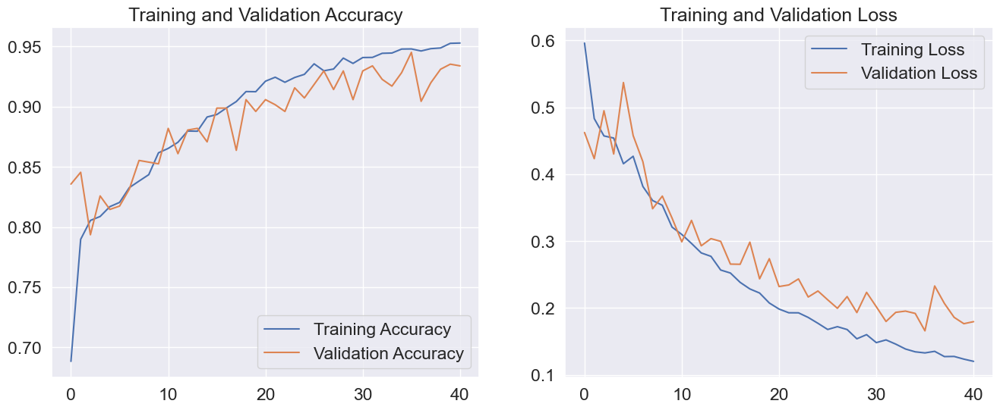

In [96]:
#Plotting the model results

#Getting the accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

#Getting the losses
loss = history.history['loss']
val_loss = history.history['val_loss']

#No of epochs it trained
epochs_range = history.epoch

#Plotting Training and Validation accuracy
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

#Plotting Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [97]:
#Loading the test data using Image Data Generator
test_gen = datagen.flow_from_directory("C:/Users/Shaikh/Desktop/jupyter/Sagar_test", target_size=(128,128), class_mode="binary", batch_size=1, shuffle=False)

Found 791 images belonging to 2 classes.


In [98]:
pred = cancer_model.evaluate(test_gen)

791/791 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - accuracy: 0.8920 - loss: 0.2800


In [110]:
#Let's Go ahead and test our model for few Images.

#Array to hold Input Images and their labels
test = []
labels = []

#Loading random 10 images
random_images = np.random.choice(data_test.index,10)

#For loop to read and store images
for i in random_images:
    #Finding their class to load from folder
    label = data_test.loc[i,"class"]
    labels.append(label)
    if label == 1:
        lab = "malignant"
    else:
        lab = "benign"
    #Creating path
    path = os.path.join("C:/Users/Shaikh/Desktop/jupyter/Sagar_test", lab, i)
    #reading image
    img = cv2.imread(path)
    #resizing to target shape
    img = cv2.resize(img,(128,128))
    #Making it an numpy array
    img = np.array(img)
    #Appending it to the list
    test.append(img)

#Making the list as numpy array
test = np.asarray(test)
#rescaling it by pixel value
test = test/255. 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


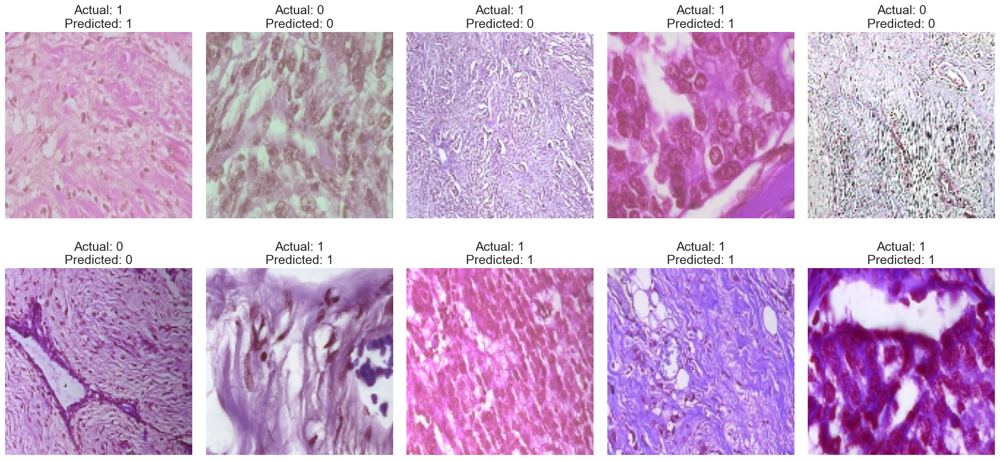

In [119]:
# Step 1: Stack inputs
test_batch = np.stack(test, axis=0)  # Shape: (10, 32, 128, 3)

# Step 2: Predict
pred = cancer_model.predict(test_batch)  # Shape: (10, ...)

plt.figure(figsize=(20, 10))
for i in range(len(test_batch)):
    plt.subplot(2, 5, i+1)
    plt.imshow(test_batch[i])
    
    # Apply threshold (0.5 by default) to convert probability to 0 or 1
    predicted_class = 1 if pred[i] > 0.5 else 0
    
    plt.title(f"Actual: {labels[i]}\nPredicted: {predicted_class}")  # Show 0 or 1
    plt.axis('off')

plt.tight_layout()
plt.show()
# Step 3: Plot results
#plt.figure(figsize=(20, 10))
#or i in range(len(test_batch)):
 #   plt.subplot(2, 5, i+1)
  #  plt.imshow(test_batch[i])
   ##plt.axis('off')
#plt.tight_layout()
#plt.show()